In [8]:
import torch
import torchvision.transforms as transforms
from PIL import Image

# Paths to your images
content_image_path = '1.png'
style_image_path = '2.png'

# Load and preprocess images
def load_image(image_path, max_size=400):
    image = Image.open(image_path).convert('RGB')
    size = min(max(image.size), max_size)
    transform = transforms.Compose([
        transforms.Resize((size, size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    image = transform(image).unsqueeze(0)  # Add batch dimension
    return image

content_image = load_image(content_image_path)
style_image = load_image(style_image_path)


Feature Extraction and Attention-Based Style Transfer

In [9]:
import torch.nn as nn
import torchvision.models as models

# Load VGG19 model for feature extraction
vgg = models.vgg19(pretrained=True).features

# Freeze all VGG parameters since we're only using it for feature extraction
for param in vgg.parameters():
    param.requires_grad_(False)

# Move model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vgg.to(device)
content_image = content_image.to(device)
style_image = style_image.to(device)

# Define function to get feature maps
def get_features(image, model, layers=None):
    if layers is None:
        layers = {'0': 'conv1_1', '5': 'conv2_1', '10': 'conv3_1', '19': 'conv4_1', '28': 'conv5_1'}
    features = {}
    x = image
    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            features[layers[name]] = x
    return features

# Extract features
content_features = get_features(content_image, vgg)
style_features = get_features(style_image, vgg)


Style Transfer with Adaptive Instance Normalization (AdaIN)

In [11]:
def adain(content, style, epsilon=1e-5):
    c_mean, c_std = content.mean([2, 3], keepdim=True), content.std([2, 3], keepdim=True)
    s_mean, s_std = style.mean([2, 3], keepdim=True), style.std([2, 3], keepdim=True)
    normalized_content = (content - c_mean) / (c_std + epsilon)
    return normalized_content * s_std + s_mean

# Example of applying AdaIN on content and style features
normalized_features = adain(content_features['conv4_1'], style_features['conv4_1'])


Texture Enhancement with Directional Loss (Optional)

In [14]:
# Define directional loss function
def direction_loss(synthesized, target):
    synthesized_gradient = torch.autograd.grad(outputs=synthesized.sum(), inputs=synthesized, create_graph=True)[0]
    target_gradient = torch.autograd.grad(outputs=target.sum(), inputs=target, create_graph=True)[0]
    loss = torch.mean((synthesized_gradient - target_gradient) ** 2)
    return loss

# This would be used in the loss calculation during the training loop
# loss_direction = direction_loss(normalized_features, content_features['conv4_1'])


Style Transfer Loss and Training Loop

In [15]:
# Define loss functions
style_weights = {'conv1_1': 1.0, 'conv2_1': 0.8, 'conv3_1': 0.5, 'conv4_1': 0.3, 'conv5_1': 0.1}
content_weight = 1e4
style_weight = 1e2

# Gram matrix to capture style features
def gram_matrix(tensor):
    _, d, h, w = tensor.size()
    tensor = tensor.view(d, h * w)
    gram = torch.mm(tensor, tensor.t())
    return gram / (d * h * w)

# Training loop
target = content_image.clone().requires_grad_(True).to(device)
optimizer = torch.optim.Adam([target], lr=0.003)

# Run the training loop
for epoch in range(300):
    target_features = get_features(target, vgg)
    content_loss = torch.mean((target_features['conv4_1'] - content_features['conv4_1']) ** 2)

    # Calculate style loss
    style_loss = 0
    for layer in style_weights:
        target_feature = target_features[layer]
        target_gram = gram_matrix(target_feature)
        style_gram = gram_matrix(style_features[layer])
        layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram) ** 2)
        style_loss += layer_style_loss

    # Combine losses
    total_loss = content_weight * content_loss + style_weight * style_loss

    # Backpropagate and update the target image
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()

    # Print loss occasionally
    if epoch % 50 == 0:
        print(f"Epoch {epoch}, Total Loss: {total_loss.item()}")


Epoch 0, Total Loss: 0.025448186323046684
Epoch 50, Total Loss: 1.7640750408172607
Epoch 100, Total Loss: 0.461712509393692
Epoch 150, Total Loss: 0.34242573380470276
Epoch 200, Total Loss: 0.4237338602542877
Epoch 250, Total Loss: 0.5040290355682373


Denoising with Quasi-Siamese Network (Optional)

In [ ]:
# Placeholder for the Quasi-Siamese Network training and denoising process
# This step would involve training a Siamese network to improve color balance and remove artifacts.
# This step is optional and complex, and typically requires a more in-depth implementation.

Post-Processing and Save Result

In [16]:
# De-normalize the image for display
def deprocess_image(image):
    transform = transforms.Normalize(
        mean=[-2.12, -2.04, -1.80], std=[4.37, 4.46, 4.44]
    )
    image = transform(image.squeeze())
    image = image.clamp_(0, 1)
    return image

# Save the final output image
final_image = deprocess_image(target)
transforms.ToPILImage()(final_image).save('stylized_output.png')

Final

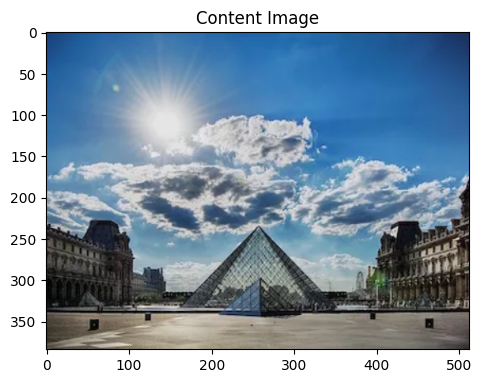

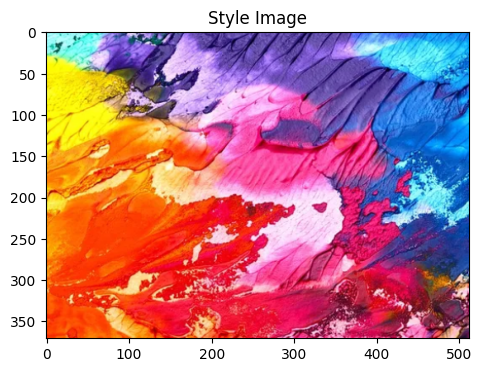

....................

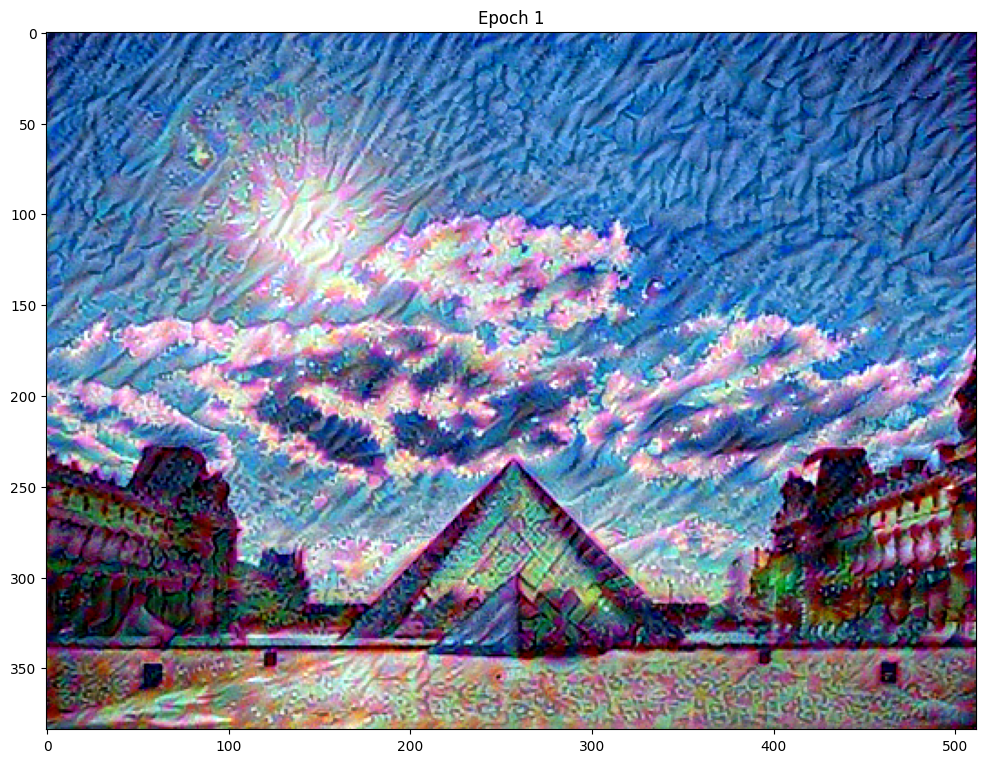

Total time: 34.8 seconds


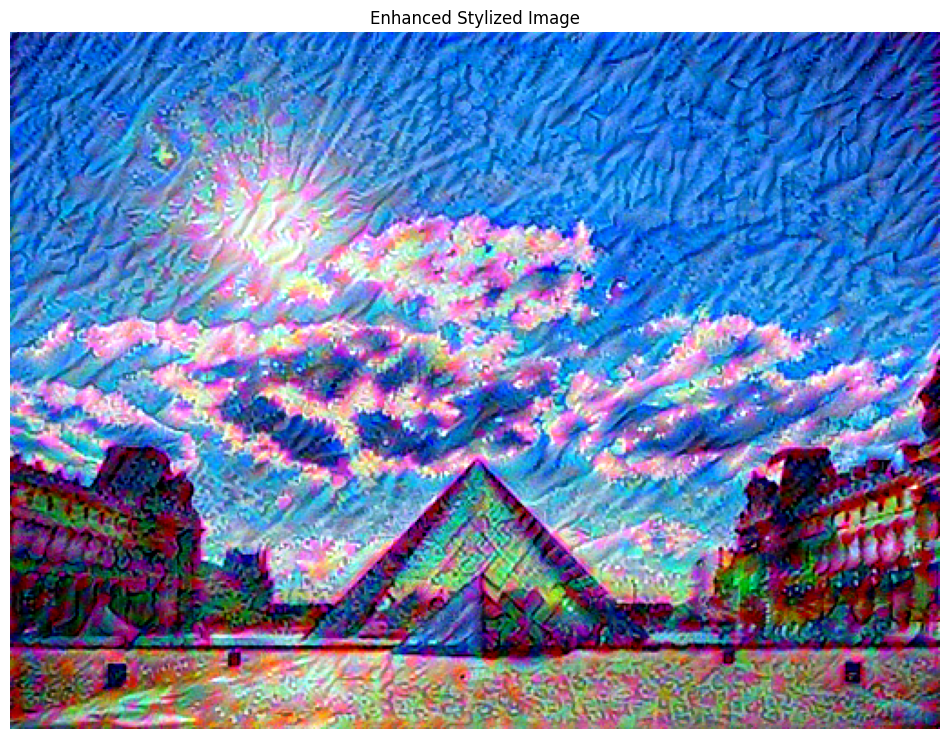

In [23]:
# Import necessary libraries
import os
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
import numpy as np
import PIL.Image
from PIL import ImageEnhance
import time

# Configure environment
os.environ['TFHUB_MODEL_LOAD_FORMAT'] = 'COMPRESSED'
plt.rcParams['figure.figsize'] = (12, 12)
plt.rcParams['axes.grid'] = False

# Helper functions
def tensor_to_image(tensor):
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return PIL.Image.fromarray(tensor)

def load_img(path_to_img):
    max_dim = 512
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)
    shape = tf.cast(tf.shape(img)[:-1], tf.float32)
    long_dim = max(shape)
    scale = max_dim / long_dim
    new_shape = tf.cast(shape * scale, tf.int32)
    img = tf.image.resize(img, new_shape)
    img = img[tf.newaxis, :]  # Add batch dimension
    return img

def imshow(image, title=None):
    if len(image.shape) > 3:
        image = tf.squeeze(image, axis=0)
    plt.imshow(image)
    if title:
        plt.title(title)
    plt.show()

def gram_matrix(input_tensor):
    result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
    input_shape = tf.shape(input_tensor)
    num_locations = tf.cast(input_shape[1] * input_shape[2], tf.float32)
    return result / num_locations

def clip_0_1(image):
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

# Load images
content_path = "1.png"
style_path = "2.png"
content_image = load_img(content_path)
style_image = load_img(style_path)

# Display images
plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')
plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

# Load VGG19 model
def vgg_layers(layer_names):
    """Creates a VGG19 model that returns a list of intermediate output values."""
    vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
    outputs = [vgg.get_layer(name).output for name in layer_names]
    model = tf.keras.Model([vgg.input], outputs)
    return model

# Define style and content layers
content_layers = ['block5_conv2']
style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']

# Define StyleContentModel class
class StyleContentModel(tf.keras.models.Model):
    def __init__(self, style_layers, content_layers):
        super(StyleContentModel, self).__init__()
        self.vgg = vgg_layers(style_layers + content_layers)
        self.style_layers = style_layers
        self.content_layers = content_layers
        self.num_style_layers = len(style_layers)
        self.vgg.trainable = False

    def call(self, inputs):
        inputs = inputs * 255.0
        preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
        outputs = self.vgg(preprocessed_input)
        style_outputs, content_outputs = (outputs[:self.num_style_layers], outputs[self.num_style_layers:])
        style_outputs = [gram_matrix(style_output) for style_output in style_outputs]
        content_dict = {content_name: value for content_name, value in zip(self.content_layers, content_outputs)}
        style_dict = {style_name: value for style_name, value in zip(self.style_layers, style_outputs)}
        return {'content': content_dict, 'style': style_dict}

# Create the model
extractor = StyleContentModel(style_layers, content_layers)
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

# Initialize the image to optimize
image = tf.Variable(content_image)

# Optimizer
opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

# Loss weights
style_weight = 1e-2
content_weight = 1e4
total_variation_weight = 30

# Define loss functions
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name] - style_targets[name])**2) for name in style_outputs.keys()])
    style_loss *= style_weight / len(style_layers)
    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name] - content_targets[name])**2) for name in content_outputs.keys()])
    content_loss *= content_weight / len(content_layers)
    loss = style_loss + content_loss
    return loss

def total_variation_loss(image):
    x_deltas, y_deltas = high_pass_x_y(image)
    return tf.reduce_sum(tf.abs(x_deltas)) + tf.reduce_sum(tf.abs(y_deltas))

def high_pass_x_y(image):
    x_var = image[:, :, 1:, :] - image[:, :, :-1, :]
    y_var = image[:, 1:, :, :] - image[:, :-1, :, :]
    return x_var, y_var

@tf.function()
def train_step(image):
    with tf.GradientTape() as tape:
        outputs = extractor(image)
        loss = style_content_loss(outputs)
        loss += total_variation_weight * tf.image.total_variation(image)
    grad = tape.gradient(loss, image)
    opt.apply_gradients([(grad, image)])
    image.assign(clip_0_1(image))

# Run the optimization
epochs = 1
steps_per_epoch = 20

start = time.time()

for n in range(epochs):
    for m in range(steps_per_epoch):
        train_step(image)
        print(".", end='', flush=True)
    plt.imshow(tensor_to_image(image))
    plt.title(f"Epoch {n + 1}")
    plt.show()

end = time.time()
print(f"Total time: {end - start:.1f} seconds")

# Save the result
file_name = 'stylized-image.png'
result_image = tensor_to_image(image)

# Enhance the color of the generated image
enhancer = ImageEnhance.Color(result_image)
result_image = enhancer.enhance(1.5)  # Adjust the factor for color enhancement (1.0 is original, >1 increases color)

# Save the enhanced image
enhanced_file_name = 'enhanced-stylized-image.png'
result_image.save(enhanced_file_name)

# Display the enhanced image
plt.imshow(result_image)
plt.title("Enhanced Stylized Image")
plt.axis('off')
plt.show()

# Optionally download the image if running in Google Colab
try:
    from google.colab import files
    files.download(enhanced_file_name)
except (ImportError, AttributeError):
    pass


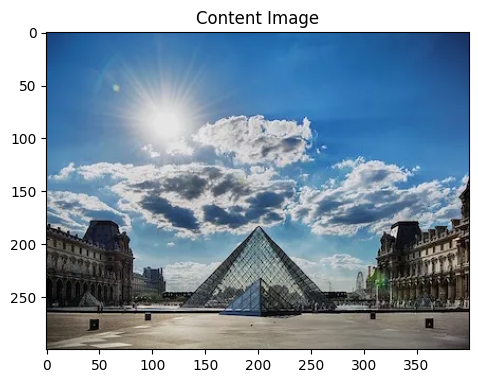

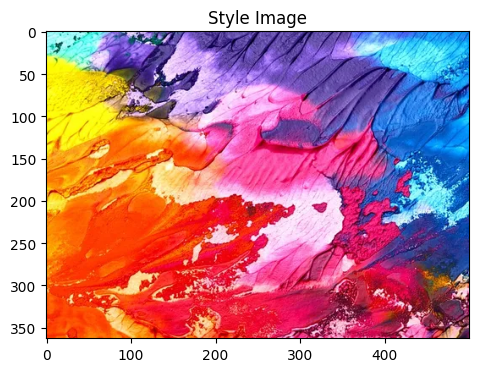

....................

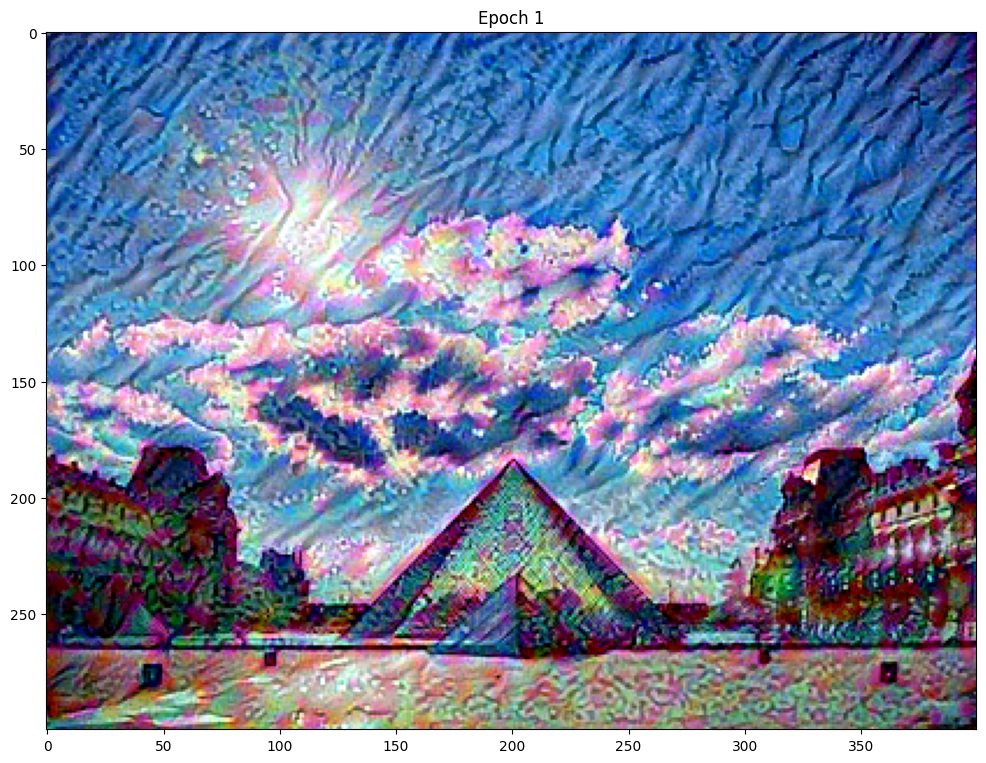

Total time: 31.0 seconds


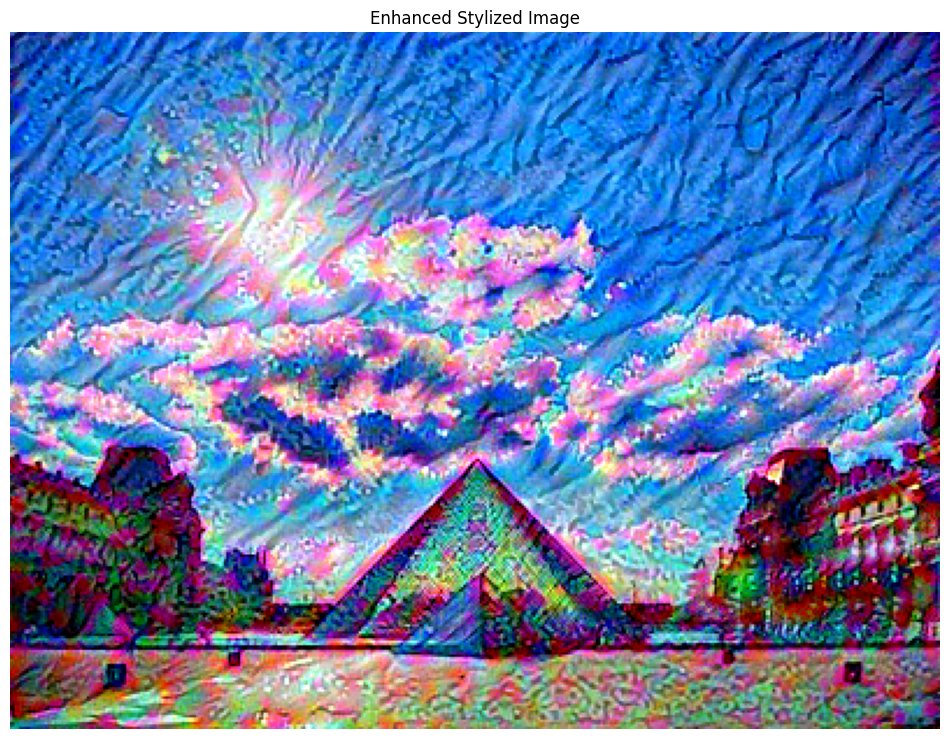

In [26]:
# Import necessary libraries
import os
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
import numpy as np
import PIL.Image
from PIL import ImageEnhance
import time

# Configure environment
os.environ['TFHUB_MODEL_LOAD_FORMAT'] = 'COMPRESSED'
plt.rcParams['figure.figsize'] = (12, 12)
plt.rcParams['axes.grid'] = False

# Helper functions
def tensor_to_image(tensor):
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return PIL.Image.fromarray(tensor)

def load_img(path_to_img):
    # Load image without resizing or scaling
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)
    img = img[tf.newaxis, :]  # Add batch dimension
    return img

def imshow(image, title=None):
    if len(image.shape) > 3:
        image = tf.squeeze(image, axis=0)
    plt.imshow(image)
    if title:
        plt.title(title)
    plt.show()

def gram_matrix(input_tensor):
    result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
    input_shape = tf.shape(input_tensor)
    num_locations = tf.cast(input_shape[1] * input_shape[2], tf.float32)
    return result / num_locations

def clip_0_1(image):
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

# Load images
content_path = "1.png"
style_path = "2.png"
content_image = load_img(content_path)
style_image = load_img(style_path)

# Display images
plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')
plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

# Load VGG19 model
def vgg_layers(layer_names):
    """Creates a VGG19 model that returns a list of intermediate output values."""
    vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
    outputs = [vgg.get_layer(name).output for name in layer_names]
    model = tf.keras.Model([vgg.input], outputs)
    return model

# Define style and content layers
content_layers = ['block5_conv2']
style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']

# Define StyleContentModel class
class StyleContentModel(tf.keras.models.Model):
    def __init__(self, style_layers, content_layers):
        super(StyleContentModel, self).__init__()
        self.vgg = vgg_layers(style_layers + content_layers)
        self.style_layers = style_layers
        self.content_layers = content_layers
        self.num_style_layers = len(style_layers)
        self.vgg.trainable = False

    def call(self, inputs):
        inputs = inputs * 255.0
        preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
        outputs = self.vgg(preprocessed_input)
        style_outputs, content_outputs = (outputs[:self.num_style_layers], outputs[self.num_style_layers:])
        style_outputs = [gram_matrix(style_output) for style_output in style_outputs]
        content_dict = {content_name: value for content_name, value in zip(self.content_layers, content_outputs)}
        style_dict = {style_name: value for style_name, value in zip(self.style_layers, style_outputs)}
        return {'content': content_dict, 'style': style_dict}

# Create the model
extractor = StyleContentModel(style_layers, content_layers)
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

# Initialize the image to optimize
image = tf.Variable(content_image)

# Optimizer
opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

# Loss weights
style_weight = 1e-2
content_weight = 1e4
total_variation_weight = 30

# Define loss functions
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name] - style_targets[name])**2) for name in style_outputs.keys()])
    style_loss *= style_weight / len(style_layers)
    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name] - content_targets[name])**2) for name in content_outputs.keys()])
    content_loss *= content_weight / len(content_layers)
    loss = style_loss + content_loss
    return loss

def total_variation_loss(image):
    x_deltas, y_deltas = high_pass_x_y(image)
    return tf.reduce_sum(tf.abs(x_deltas)) + tf.reduce_sum(tf.abs(y_deltas))

def high_pass_x_y(image):
    x_var = image[:, :, 1:, :] - image[:, :, :-1, :]
    y_var = image[:, 1:, :, :] - image[:, :-1, :, :]
    return x_var, y_var

@tf.function()
def train_step(image):
    with tf.GradientTape() as tape:
        outputs = extractor(image)
        loss = style_content_loss(outputs)
        loss += total_variation_weight * tf.image.total_variation(image)
    grad = tape.gradient(loss, image)
    opt.apply_gradients([(grad, image)])
    image.assign(clip_0_1(image))

# Run the optimization
epochs = 1
steps_per_epoch = 20

start = time.time()

for n in range(epochs):
    for m in range(steps_per_epoch):
        train_step(image)
        print(".", end='', flush=True)
    plt.imshow(tensor_to_image(image))
    plt.title(f"Epoch {n + 1}")
    plt.show()

end = time.time()
print(f"Total time: {end - start:.1f} seconds")

# Save the result
file_name = 'stylized-image.png'
result_image = tensor_to_image(image)

# Enhance the color of the generated image
enhancer = ImageEnhance.Color(result_image)
result_image = enhancer.enhance(1.5)  # Adjust the factor for color enhancement (1.0 is original, >1 increases color)

# Save the enhanced image
enhanced_file_name = 'enhanced-stylized-image.png'
result_image.save(enhanced_file_name)

# Display the enhanced image
plt.imshow(result_image)
plt.title("Enhanced Stylized Image")
plt.axis('off')
plt.show()



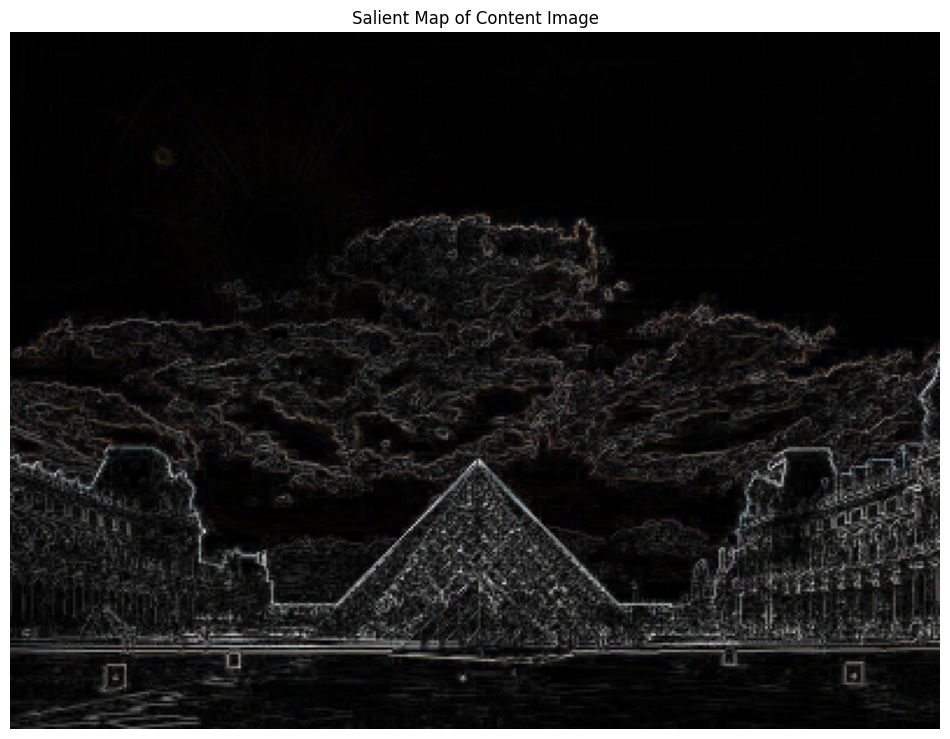

In [28]:
def salient_map(image):
    x_var, y_var = high_pass_x_y(image)
    
    # Crop the larger dimension to match the smaller one
    min_height = min(x_var.shape[1], y_var.shape[1])
    min_width = min(x_var.shape[2], y_var.shape[2])
    
    x_var = x_var[:, :min_height, :min_width, :]
    y_var = y_var[:, :min_height, :min_width, :]
    
    # Compute the gradient magnitude
    gradient_magnitude = tf.sqrt(tf.square(x_var) + tf.square(y_var))
    return gradient_magnitude

# Create a salient map from the content image
salient_image = salient_map(content_image)

# Display the salient map
plt.imshow(tf.squeeze(salient_image), cmap='gray')
plt.title("Salient Map of Content Image")
plt.axis('off')
plt.show()


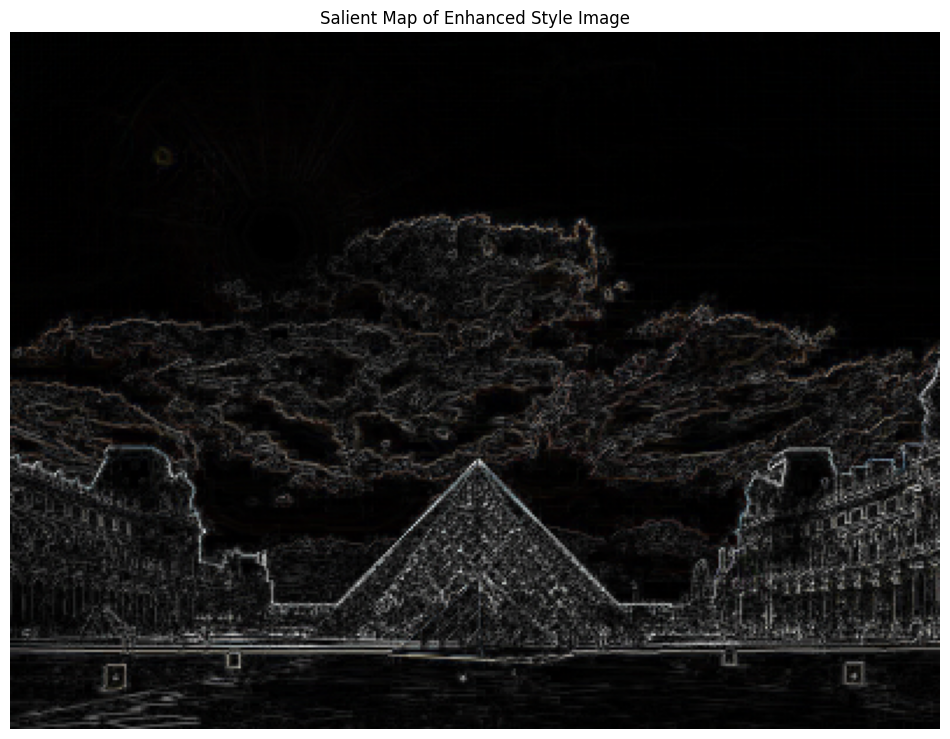

In [30]:
def salient_map(image):
    x_var, y_var = high_pass_x_y(image)
    
    # Crop the larger dimension to match the smaller one
    min_height = min(x_var.shape[1], y_var.shape[1])
    min_width = min(x_var.shape[2], y_var.shape[2])
    
    x_var = x_var[:, :min_height, :min_width, :]
    y_var = y_var[:, :min_height, :min_width, :]
    
    # Compute the gradient magnitude
    gradient_magnitude = tf.sqrt(tf.square(x_var) + tf.square(y_var))
    return gradient_magnitude
stylised_image=load_img("enhanced-stylized-image.png")
# Create a salient map from the content image
salient_image = salient_map(content_image)

# Display the salient map
plt.imshow(tf.squeeze(salient_image), cmap='gray')
plt.title("Salient Map of Enhanced Style Image")
plt.axis('off')
plt.show()


Other input

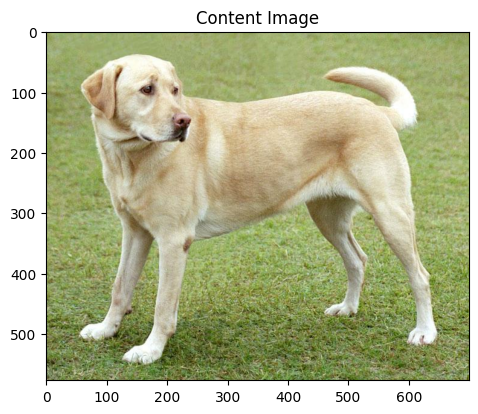

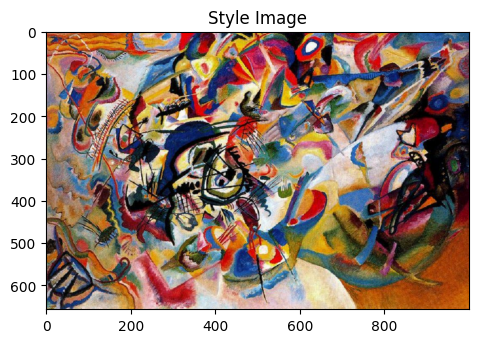

........

In [ ]:
# Import necessary libraries
import os
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
import numpy as np
import PIL.Image
from PIL import ImageEnhance
import time

# Configure environment
os.environ['TFHUB_MODEL_LOAD_FORMAT'] = 'COMPRESSED'
plt.rcParams['figure.figsize'] = (12, 12)
plt.rcParams['axes.grid'] = False

# Helper functions
def tensor_to_image(tensor):
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return PIL.Image.fromarray(tensor)

def load_img(path_to_img):
    # Load image without resizing or scaling
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)
    img = img[tf.newaxis, :]  # Add batch dimension
    return img

def imshow(image, title=None):
    if len(image.shape) > 3:
        image = tf.squeeze(image, axis=0)
    plt.imshow(image)
    if title:
        plt.title(title)
    plt.show()

def gram_matrix(input_tensor):
    result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
    input_shape = tf.shape(input_tensor)
    num_locations = tf.cast(input_shape[1] * input_shape[2], tf.float32)
    return result / num_locations

def clip_0_1(image):
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

# Load images
content_path = tf.keras.utils.get_file('YellowLabradorLooking_new.jpg', 'https://storage.googleapis.com/download.tensorflow.org/example_images/YellowLabradorLooking_new.jpg')
style_path = tf.keras.utils.get_file('kandinsky5.jpg', 'https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg')
content_image = load_img(content_path)
style_image = load_img(style_path)

# Display images
plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')
plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

# Load VGG19 model
def vgg_layers(layer_names):
    """Creates a VGG19 model that returns a list of intermediate output values."""
    vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
    outputs = [vgg.get_layer(name).output for name in layer_names]
    model = tf.keras.Model([vgg.input], outputs)
    return model

# Define style and content layers
content_layers = ['block5_conv2']
style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']

# Define StyleContentModel class
class StyleContentModel(tf.keras.models.Model):
    def __init__(self, style_layers, content_layers):
        super(StyleContentModel, self).__init__()
        self.vgg = vgg_layers(style_layers + content_layers)
        self.style_layers = style_layers
        self.content_layers = content_layers
        self.num_style_layers = len(style_layers)
        self.vgg.trainable = False

    def call(self, inputs):
        inputs = inputs * 255.0
        preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
        outputs = self.vgg(preprocessed_input)
        style_outputs, content_outputs = (outputs[:self.num_style_layers], outputs[self.num_style_layers:])
        style_outputs = [gram_matrix(style_output) for style_output in style_outputs]
        content_dict = {content_name: value for content_name, value in zip(self.content_layers, content_outputs)}
        style_dict = {style_name: value for style_name, value in zip(self.style_layers, style_outputs)}
        return {'content': content_dict, 'style': style_dict}

# Create the model
extractor = StyleContentModel(style_layers, content_layers)
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

# Initialize the image to optimize
image = tf.Variable(content_image)

# Optimizer
opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

# Loss weights
style_weight = 1e-2
content_weight = 1e4
total_variation_weight = 30

# Define loss functions
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name] - style_targets[name])**2) for name in style_outputs.keys()])
    style_loss *= style_weight / len(style_layers)
    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name] - content_targets[name])**2) for name in content_outputs.keys()])
    content_loss *= content_weight / len(content_layers)
    loss = style_loss + content_loss
    return loss

def total_variation_loss(image):
    x_deltas, y_deltas = high_pass_x_y(image)
    return tf.reduce_sum(tf.abs(x_deltas)) + tf.reduce_sum(tf.abs(y_deltas))

def high_pass_x_y(image):
    x_var = image[:, :, 1:, :] - image[:, :, :-1, :]
    y_var = image[:, 1:, :, :] - image[:, :-1, :, :]
    return x_var, y_var

@tf.function()
def train_step(image):
    with tf.GradientTape() as tape:
        outputs = extractor(image)
        loss = style_content_loss(outputs)
        loss += total_variation_weight * tf.image.total_variation(image)
    grad = tape.gradient(loss, image)
    opt.apply_gradients([(grad, image)])
    image.assign(clip_0_1(image))

# Run the optimization
epochs = 1
steps_per_epoch = 20

start = time.time()

for n in range(epochs):
    for m in range(steps_per_epoch):
        train_step(image)
        print(".", end='', flush=True)
    plt.imshow(tensor_to_image(image))
    plt.title(f"Epoch {n + 1}")
    plt.show()

end = time.time()
print(f"Total time: {end - start:.1f} seconds")

# Save the result
file_name = 'stylized-image-1.png'
result_image = tensor_to_image(image)

# Enhance the color of the generated image
enhancer = ImageEnhance.Color(result_image)
result_image = enhancer.enhance(1.5)  # Adjust the factor for color enhancement (1.0 is original, >1 increases color)

# Save the enhanced image
enhanced_file_name = 'enhanced-stylized-image-1.png'
result_image.save(enhanced_file_name)

# Display the enhanced image
plt.imshow(result_image)
plt.title("Enhanced Stylized Image")
plt.axis('off')
plt.show()

